# Lab Assignment Six: Convolutional Neural Networks
Name: Marc Pham, Alonso Gurrola

Dataset: [Data](https://archive.ics.uci.edu/dataset/908/realwaste)

Original Paper: [RealWaste: A Novel Real-Life Data Set for Landfill Waste Classification Using Deep Learning](https://www.mdpi.com/2078-2489/14/12/633)

## 1. Preparation

In [158]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os 
from PIL import Image
from skimage import color
import cv2
import time

from skimage.feature import daisy

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Activation, Input, RandomFlip, RandomRotation, RandomZoom, RandomTranslation
from tensorflow.keras.layers import Embedding, Concatenate, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model, FeatureSpace
from tensorflow.keras.metrics import FBetaScore, Precision, Recall
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
import tensorflow.keras as keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Reshape
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.utils import plot_model
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.regularizers import l1
from sklearn.metrics import classification_report
from tensorflow.keras.models import clone_model

from skimage.filters import gabor_kernel
from scipy import ndimage as ndi
from scipy import stats

tf.random.set_seed(221)
# import warnings
# warnings.filterwarnings('ignore')

### 1.1: Loading the Images

In [2]:
data_path = "RealWaste_data/"
os.chdir(data_path)

To prepare the data, we read in the images as numpy arrays. The images are already the same size (524x524) and was represented as color images.  To pre-process these images, we turn the images into grayscale and downsized the image to be 12.5% of its original size, so the images are now be 66x66.  We did this so the neural network would not take too long to train, and we would not lose important information on the general shape and size of the object.

Category Cardboard is complete!
Category Food Organics is complete!
Category Glass is complete!
Category Metal is complete!
Category Miscellaneous Trash is complete!
Category Paper is complete!
Category Plastic is complete!
Category Textile Trash is complete!
Category Vegetation is complete!
Time: 24.2184 seconds


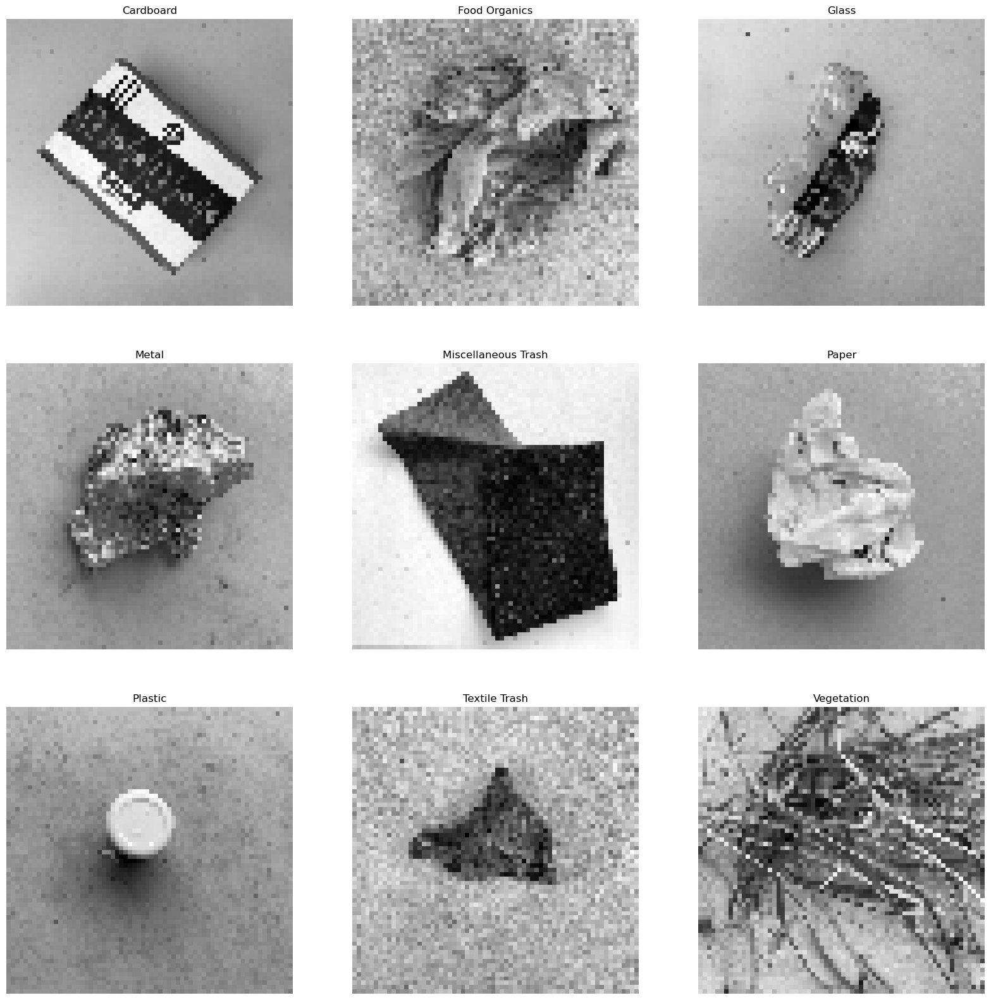

In [3]:
start = time.time()

num_jpgs = []
data_set = []

fig = plt.figure(figsize=(20,20))
count = 1

# Remove any hidden files
categories = sorted(os.listdir())
for i in range(len(categories) - 1, -1, -1):
    if categories[i][0] == '.':
        categories.pop(i)

for category in categories:
    
    os.chdir(category)
    num_jpgs.append(len(os.listdir()))

    indiv_count = 0
    printt = True
    
    for img_name in os.listdir():

        # Read in the images as numpy arrays, then linearize them.
        img = color.rgb2gray(Image.open(img_name))
        img = cv2.resize(img, None, fx=0.125, fy=0.125)
        
        data_set.append(img)

        # Output 1 Image from each of the Categories.
        # if printt:
        if indiv_count == 2:
            ax = fig.add_subplot(3, 3, count)
            plt.imshow(img, cmap='gray')
            plt.axis('off')
            plt.title(category)
            count += 1
            printt = False

        indiv_count += 1

    os.chdir("../")
    print(f"Category {category} is complete!")

size = len(img)
data_set = np.array(data_set)
end = time.time()
print(f"Time: {(end-start):.4f} seconds")

### 1.2: Appropriate Metrics

To evaluate the effectiveness of our prediction algorithm, we will calculate the accuracy for each individual label and then compute the average of these accuracies to obtain the final accuracy. Given that our dataset is somewhat imbalanced (with one category representing 19.38% and another 6.69%), we aim to assess the accuracy of each label to ensure that one category does not disproportionately outperform the others due to the class imbalance. We chose accuracy over metrics like precision and recall because, in our business case, the consequences of false positives and false negatives are equally significant. There is no particular classification error (false positive or false negative) that carries more severe consequences, making accuracy a suitable metric for our needs.

In [4]:
NUM_CLASSES = 9
labels = np.repeat([i for i in range(0,9)], num_jpgs)
Labels = pd.DataFrame()
Labels['Labels'] = categories
Labels['Number of Label'] = [i for i in range(0,9)]
Labels['Number of Occurrences'] = num_jpgs
labels_percentage = Labels['Number of Occurrences'] * 100 / len(labels)
Labels['Percentage of Occurrences'] = labels_percentage.apply(lambda x: "{:.2f}%".format(x))
labels = np.array(labels)
print(f"Total Number of Occurrences: {len(labels)}")
Labels

Total Number of Occurrences: 4752


,Labels,Number of Label,Number of Occurrences,Percentage of Occurrences
0,Cardboard,0,461,9.70%
1,Food Organics,1,411,8.65%
2,Glass,2,420,8.84%
3,Metal,3,790,16.62%
4,Miscellaneous Trash,4,495,10.42%
5,Paper,5,500,10.52%
6,Plastic,6,921,19.38%
7,Textile Trash,7,318,6.69%
8,Vegetation,8,436,9.18%


### 1.3: Train-Test Split

For our prediction algorithm, Leave-One-Out Cross Validation would best represent how the model would be used in reality. This method fits our business case, which aims to help environmental agencies, such as the United States’ Environmental Protection Agency (EPA), to automate waste segregation. These agencies may use our model on sorting belts, which use optical sensors and cameras to identify and guide specific types of waste into their appropriate bins. Additionally, they could use our model on waste classification apps, where residents can take pictures of waste items and learn how to properly dispose of them. Both of these applications classify one piece of waste at a time, which is similar to how LOOCV operates.

However, with a dataset with 4752 examples, LOOCV would be computationally intensive and infeasible to run. Therefore, we opted to use 5-fold stratified cross-validation to divide our data. Stratification was essential due to the class imbalance in the types of waste in our dataset. 5-fold cross-validation was selected as the closest alternative to a LOOCV, striking a reasonable trade-off between training time and performance evaluation. In waste management, waste is segregated in batches; however, no set standard exists for batch size in terms of the number of pieces of waste. Thus, it is not possible to determine a real-world value for k to accurately reflect these batch sizes.

In [87]:
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=9)

## 2. Modeling

In [175]:
def plot_metrics(history):
    plt.figure(figsize=(20,10), dpi=200)

    plt.subplot(1,2,1)
    plt.plot(history.history['avg_accuracy_per_class'], label='Training')
    plt.plot(history.history['val_avg_accuracy_per_class'], label='Validation')
    plt.legend(loc='best')
    plt.title('Fold Validation Accuracy over Epochs')
    plt.ylabel('Accuracy')
    plt.xlabel('epochs')
    
    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label='Training')
    plt.plot(history.history['val_loss'], label='Validation')
    plt.legend(loc='best')
    plt.title('Loss over Epochs')
    plt.ylabel('Loss')
    plt.xlabel('epochs')

    plt.tight_layout()
    plt.show()

In [168]:
def avg_accuracy_per_class(y_true, y_pred, num_classes=9):
    # Convert y_pred to class predictions by taking the argmax
    y_pred_classes = tf.argmax(y_pred, axis=1)

    # Calculate True Positives and False Negatives for each class
    tp = [0] * num_classes
    fn = [0] * num_classes

    for i in range(num_classes):
        # True Positives for class i
        tp[i] = tf.reduce_sum(tf.cast(tf.logical_and(tf.equal(y_true, i), tf.equal(y_pred_classes, i)), tf.float32))
        # False Negatives for class i
        fn[i] = tf.reduce_sum(tf.cast(tf.logical_and(tf.equal(y_true, i), tf.not_equal(y_pred_classes, i)), tf.float32))

    recalls = []
    # # Calculate recall per class (TP / (TP + FN))
    for tp_i, fn_i in zip(tp, fn):
        if tp_i + fn_i != 0: # Ignore all classes where there was nothing there in the first place.
            recalls.append(tp_i / (tp_i + fn_i))
            
    # Calculate macro average recall (mean of recalls for all classes)
    macro_avg_recall = tf.reduce_mean(recalls)

    return macro_avg_recall


In [191]:

def test_model(data_set, labels, kf, base_model, NUM_CLASSES, save_file, bs=32, lr=0.001, ep=100):
    accuracies = []
    
    num = 1
    for train_i, test_i in kf.split(data_set, labels):
        print(f"Graph {num}:")
    
        X_train, X_val = data_set[train_i], data_set[test_i]
        y_train, y_val = labels[train_i], labels[test_i]
    
        m = clone_model(base_model)
        opt = tf.keras.optimizers.legacy.Adam(learning_rate=lr)
        m.compile(loss='sparse_categorical_crossentropy',
                      optimizer=opt,
                      metrics=[avg_accuracy_per_class],
                 run_eagerly=True) # Potential solution for the cusom metric (mainly the lack of numpy())?
    
        history = m.fit(X_train, y_train, epochs=ep, batch_size=bs, validation_data=(X_val, y_val), verbose=0)
        plot_metrics(history)

        y_pred = m.predict(X_val)
        # To make the final pred a 2D array, initialize it as the first predicted y.
        if num == 1:
            pred = y_pred
        else:
            pred = np.append(pred, y_pred, axis=0)
        
        # y_pred_classes = np.argmax(y_pred, axis=1)
        # report = classification_report(y_val, y_pred_classes, target_names=[str(i) for i in range(NUM_CLASSES)], zero_division=0, output_dict=True)
        # print(report)
    
        # Recall is calculated like accuracy if it is just one label.
        accuracies.append(history.history['val_avg_accuracy_per_class'][-1])
        print(f'Fold validation accuracy: {accuracies[-1]}')
        num+=1

    np.savetxt(save_file, pred, delimiter=',')
    return pred, accuracies

### 2.1: Data Augmentation Techniques

The chosen data expansion techniques are ideal for this dataset due to the many possible orientations and positions of the waste products in these top-down images. **Random Flip** (horizontal and vertical) and **Random Rotation** help account for the different orientations that the waste products could take in a top-down image. **Random Zoom** simulates variations in camera distance and objects of different sizes. **Random Translation** shifts the waste within the frame, addressing cases where waste is off-center.

In [8]:
data_augmentation = tf.keras.Sequential([
    RandomFlip(mode="horizontal_and_vertical"),
    RandomRotation(0.25),
    RandomZoom(0.2),
    RandomTranslation(0.05, 0.05)
])

### 2.2: CNN1 and Modified CNN1

The first Convolutional Neural Network we tried has 1 convolutional layer. The loss functions converge to a value around 1.3 (1st K-Fold), 1.4 (3rd and 4th), 1.6 (5th), and 1.9 (2nd); however, each the loss functions appear to oscillate around that value. For future networks, we tweak some parameters like the learning rate and batch size to address the issue of oscillation.

Graph 1:


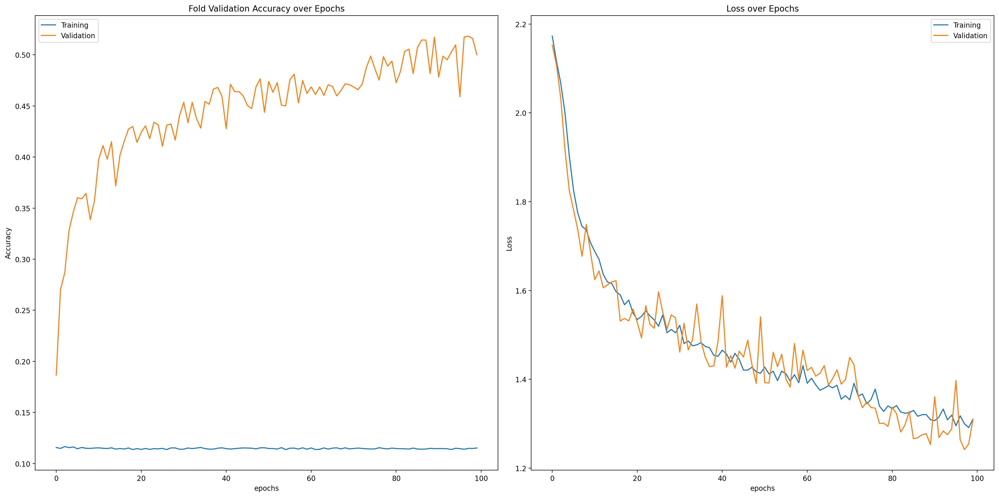

30/30 [==============================] - 0s 7ms/step
Fold validation accuracy: 0.49993208050727844
Graph 2:


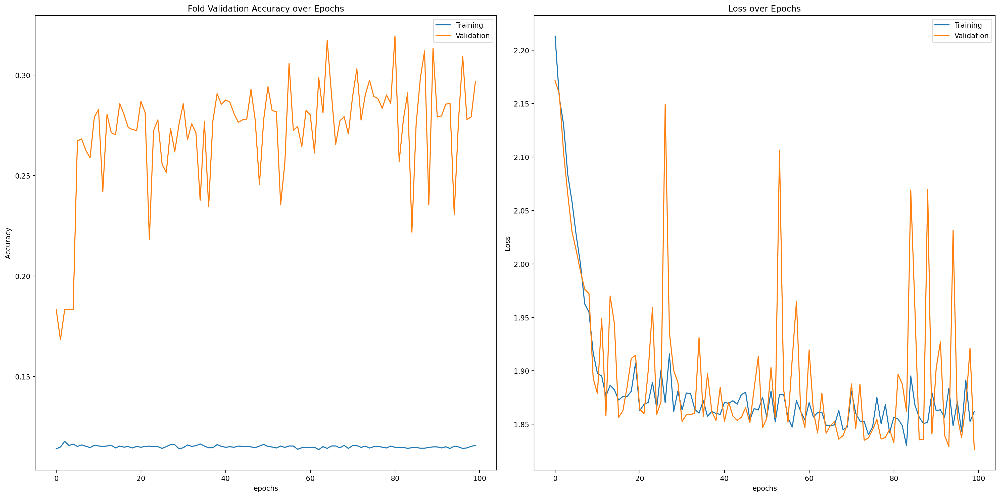

30/30 [==============================] - 0s 6ms/step
Fold validation accuracy: 0.296875
Graph 3:


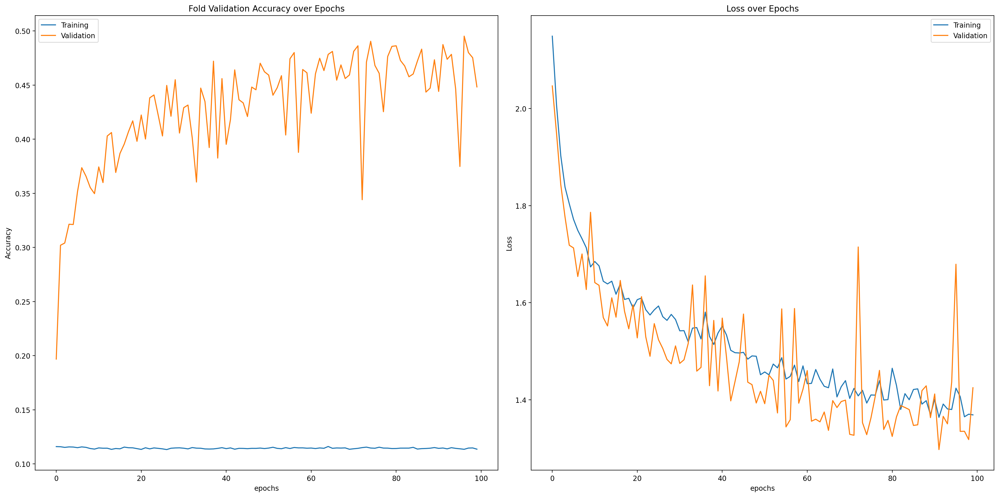

30/30 [==============================] - 0s 6ms/step
Fold validation accuracy: 0.44824808835983276
Graph 4:


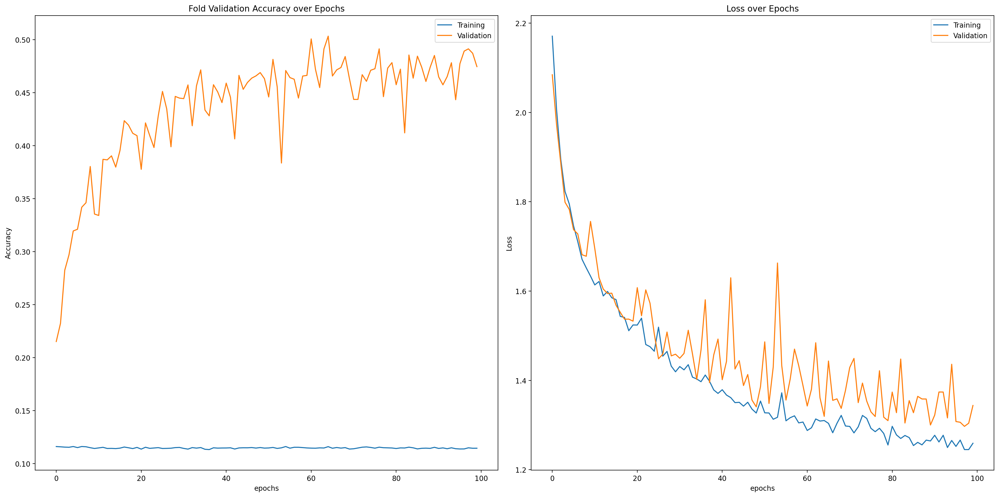

30/30 [==============================] - 0s 6ms/step
Fold validation accuracy: 0.47457388043403625
Graph 5:


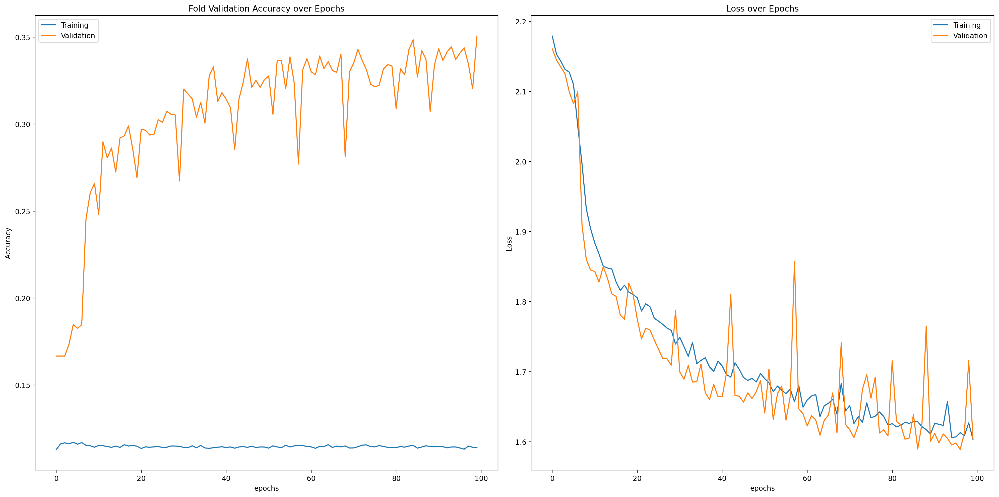

30/30 [==============================] - 0s 5ms/step
Fold validation accuracy: 0.350615531206131
CPU times: user 1h 51min 6s, sys: 10min 34s, total: 2h 1min 40s
Wall time: 39min 49s


In [181]:
%%time
cnn1 = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=16, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(11, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred1, acc1 = test_model(data_set, labels, kf, cnn1, NUM_CLASSES, "cnn1_predictions.csv")

We changed the number of filters in the one Convolution layer to 32, the pool size to be (4,4), and the last dense layer to be 12 nodes instead of 11. To address the issue of oscillation, we will also try to increase the batch size to 64 and decrease the learning rate of the optimizer to 0.0003. With the changes to the batch size and learning rate, the neural network appears to have converged more smoothly than it did previously. However, in doing so, the accuracy (taking the accuracy of each label and averaging them) appears to have been lower. If we were not time-limited, we would run the code with more epochs to see if the neural networks would find a lower minimum.

Graph 1:


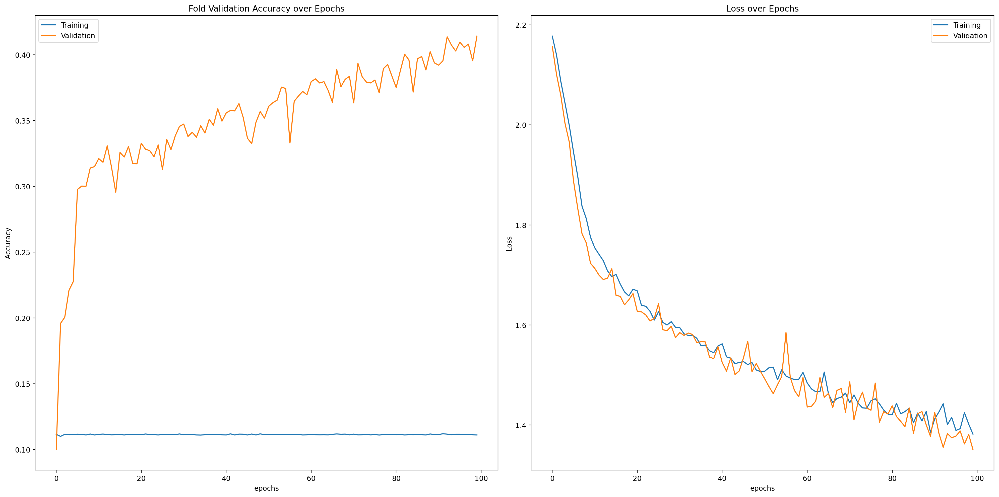

30/30 [==============================] - 0s 16ms/step
Fold validation accuracy: 0.41409093141555786
Graph 2:


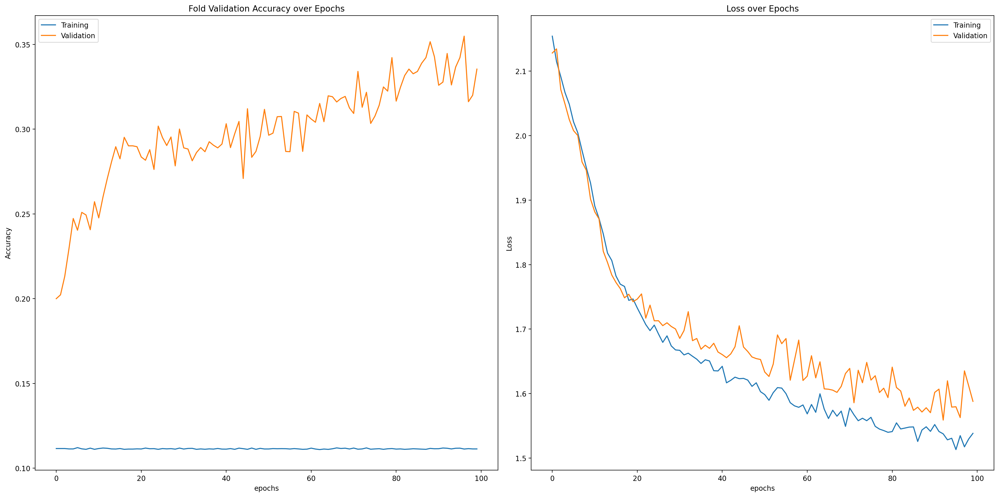

30/30 [==============================] - 0s 10ms/step
Fold validation accuracy: 0.3354450762271881
Graph 3:


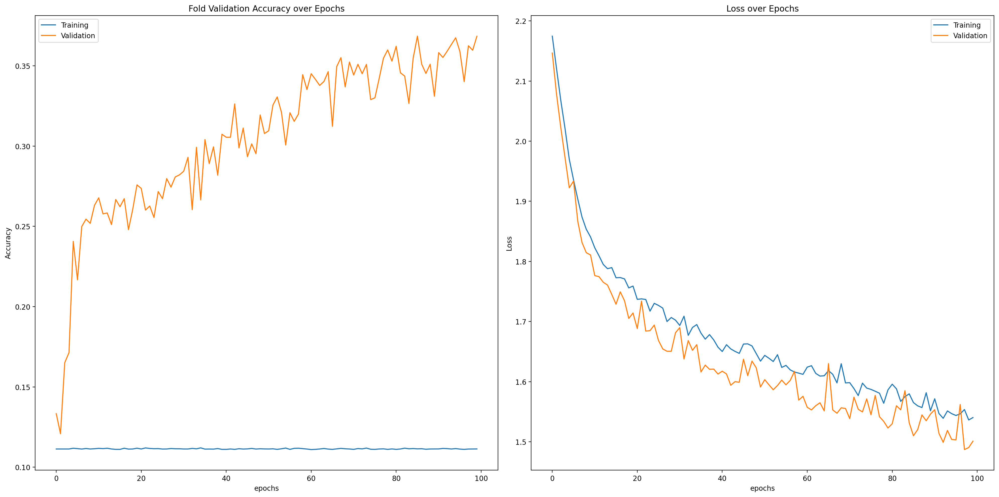

30/30 [==============================] - 0s 8ms/step
Fold validation accuracy: 0.3684413731098175
Graph 4:


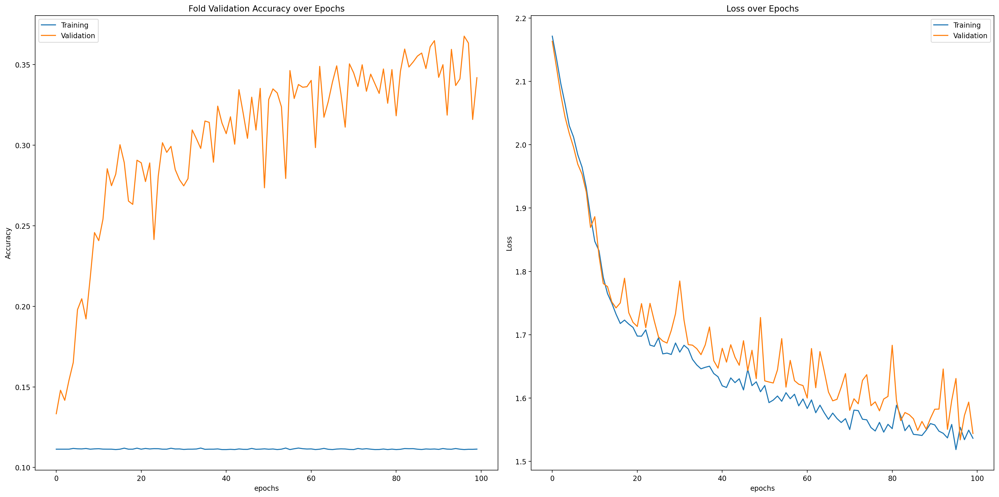

30/30 [==============================] - 0s 9ms/step
Fold validation accuracy: 0.34187886118888855
Graph 5:


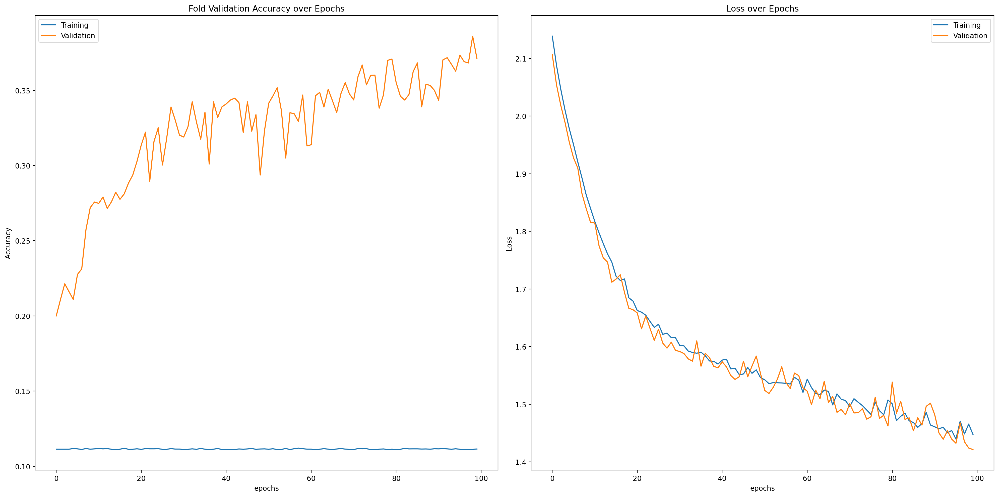

30/30 [==============================] - 0s 8ms/step
Fold validation accuracy: 0.3711998760700226
CPU times: user 1h 28min 4s, sys: 13min 32s, total: 1h 41min 37s
Wall time: 27min 12s


In [189]:
%%time
cnn1_modified = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(4, 4)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(12, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred1_modified, acc1_modified = test_model(data_set, labels, kf, cnn1_modified, NUM_CLASSES, "cnn1_modified_predictions.csv", bs=64, lr=0.0003)

### 2.3: CNN2 and Modified CNN2

The second convolutional neural network has 2 convolutional layers. Compared to the last neural network, we decided to increase the batch size to 128 (since increasing it seemed to stabilize the convergence). However, we will keep the learning rate the same since we it converged slowly the last time.

Graph 1:


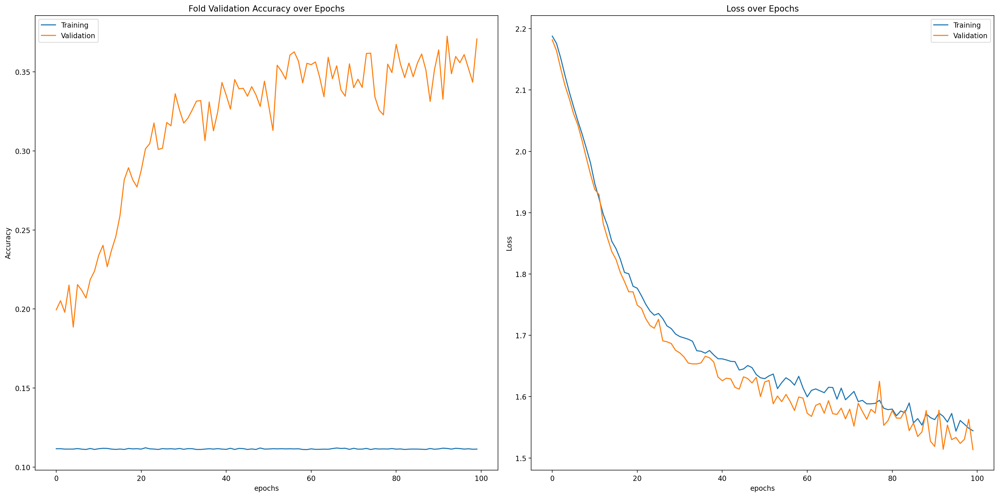

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.3708712160587311
Graph 2:


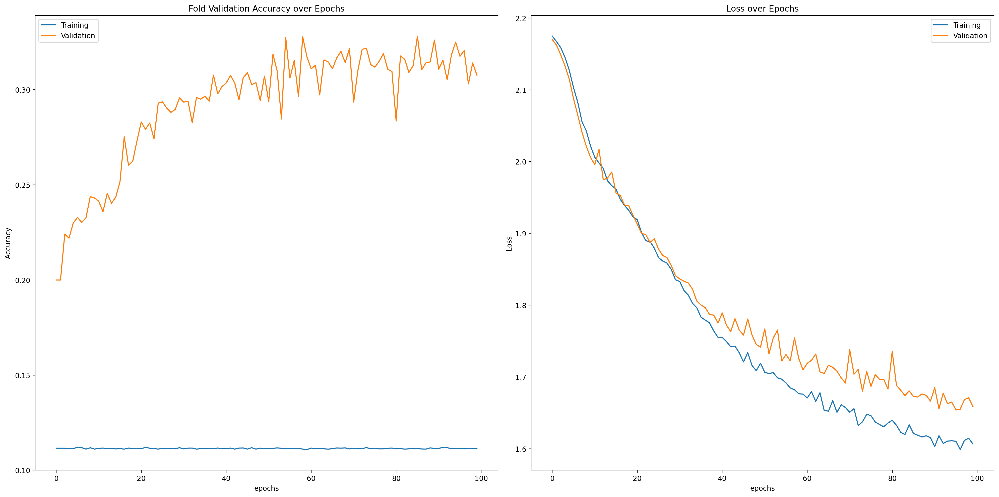

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.3077083230018616
Graph 3:


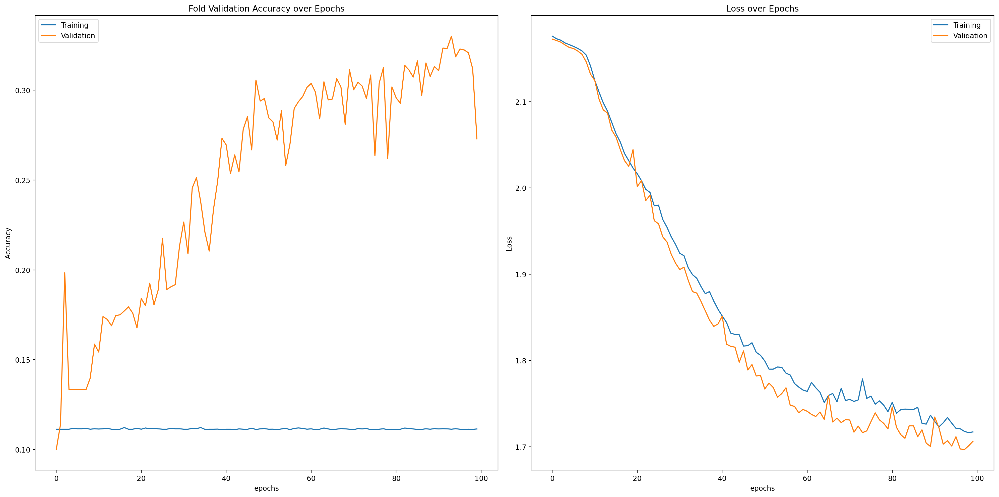

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.27291667461395264
Graph 4:


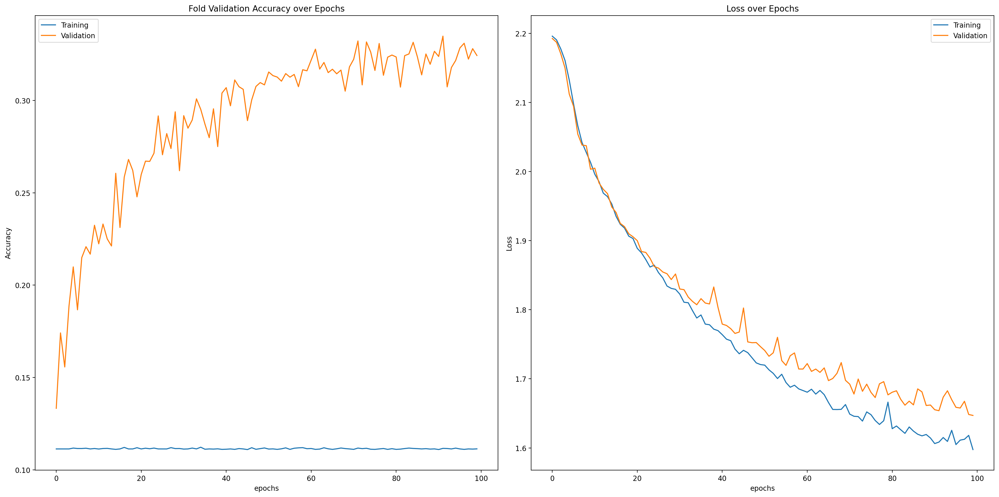

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.32430556416511536
Graph 5:


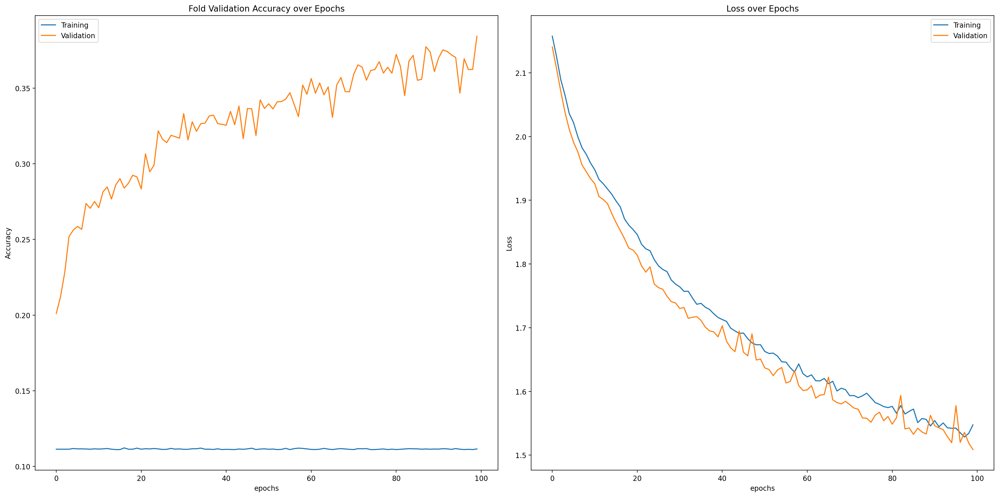

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.3843942880630493
CPU times: user 2h 14min 2s, sys: 22min 4s, total: 2h 36min 7s
Wall time: 36min 3s


In [194]:
%%time
cnn2 = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(11, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred2, acc2 = test_model(data_set, labels, kf, cnn2, NUM_CLASSES, "cnn2_predictions.csv", bs=64, lr=0.00008, ep=100)

We changed the number of filters in the second Convolution layer to be 16, the pool sizes to be (4,4), and the last dense layer to be 12 nodes instead of 11.

Graph 1:


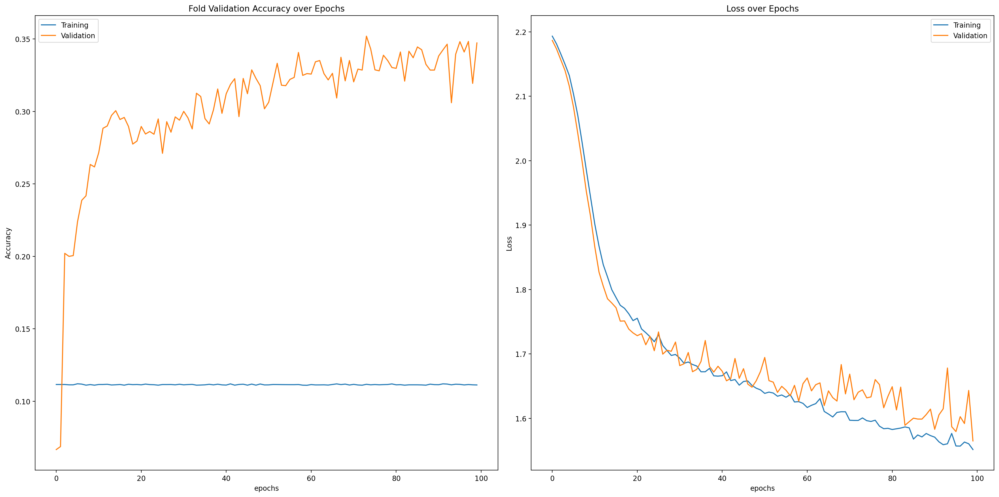

30/30 [==============================] - 0s 9ms/step
Fold validation accuracy: 0.34728220105171204
Graph 2:


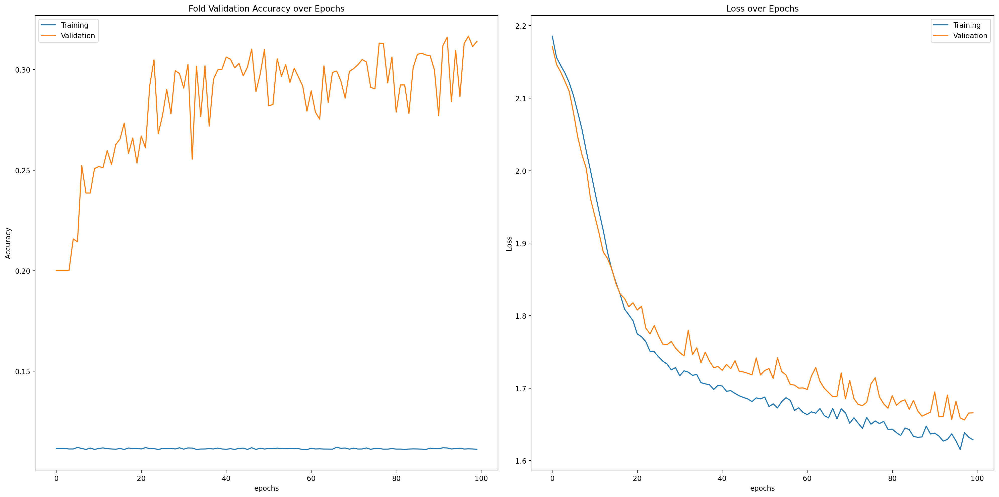

30/30 [==============================] - 0s 8ms/step
Fold validation accuracy: 0.31408146023750305
Graph 3:


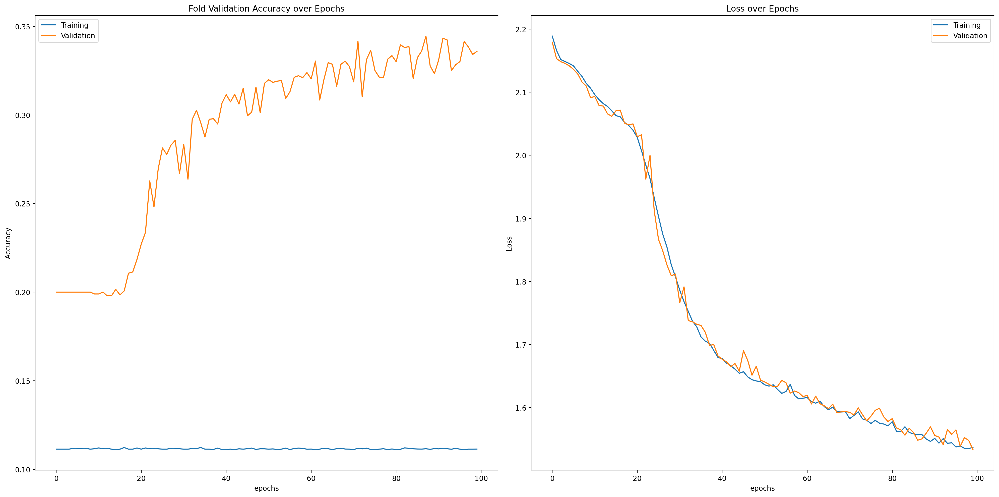

30/30 [==============================] - 0s 9ms/step
Fold validation accuracy: 0.33589890599250793
Graph 4:


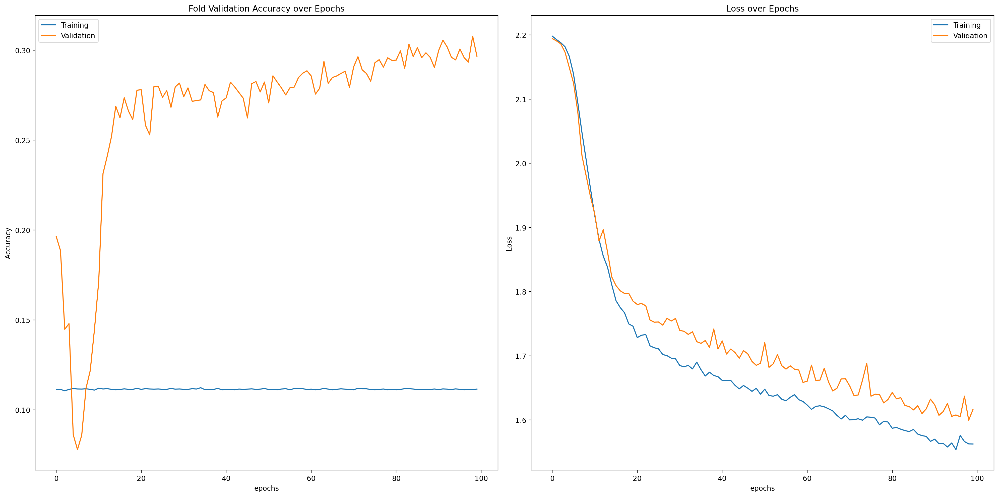

30/30 [==============================] - 0s 8ms/step
Fold validation accuracy: 0.29673996567726135
Graph 5:


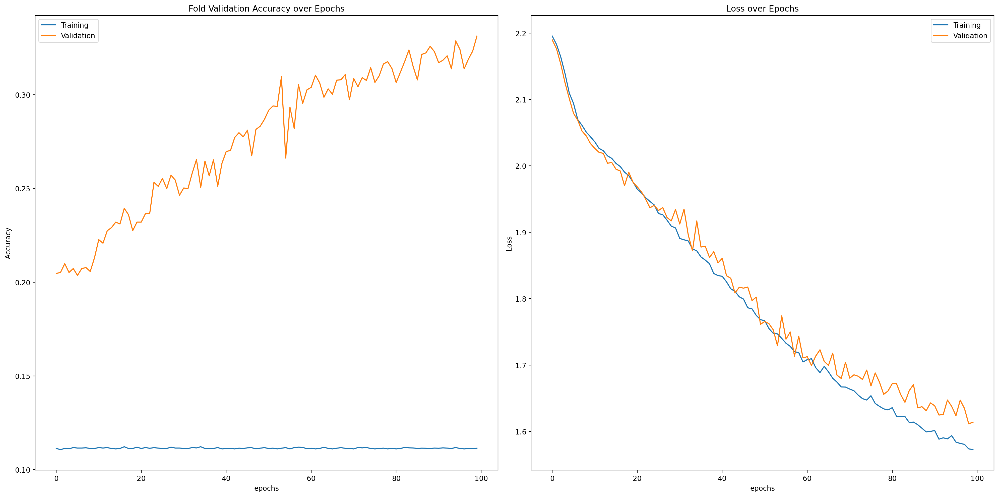

30/30 [==============================] - 0s 9ms/step
Fold validation accuracy: 0.33123070001602173
CPU times: user 1h 7min 41s, sys: 13min 24s, total: 1h 21min 6s
Wall time: 22min 59s


In [196]:
%%time
cnn2_modified = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(4, 4)),
    Conv2D(filters=16, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(4, 4)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(12, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred2_modified, acc2_modified = test_model(data_set, labels, kf, cnn2_modified, NUM_CLASSES, "cnn2_modified_predictions.csv", bs=64, lr=0.0002, ep=100)

### 2.4: Extra Work: A 5th CNN

In [ ]:
%%time
cnn_extra = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=16, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=8, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=4, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(12, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred_extra, acc_extra = test_model(data_set, labels, kf, cnn_extra, NUM_CLASSES, "cnn_extra_predictions.csv", bs=64, lr=0.0003)

### 2.6: Comparing to the Multi-Layer Perceptron

In [ ]:
mlp = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    data_augmentation,
    Flatten(),
    Dense(100, input_dim=1, activation='relu'),
    Dense(50, activation='relu'),
    Dense(50, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred_mlp, acc_mlp = test_model(data_set, labels, kf, mlp, NUM_CLASSES, "mlp_predictions.csv", bs=64, lr=0.0003)

# Duplicate Outputs in case we mess up

Graph 1:


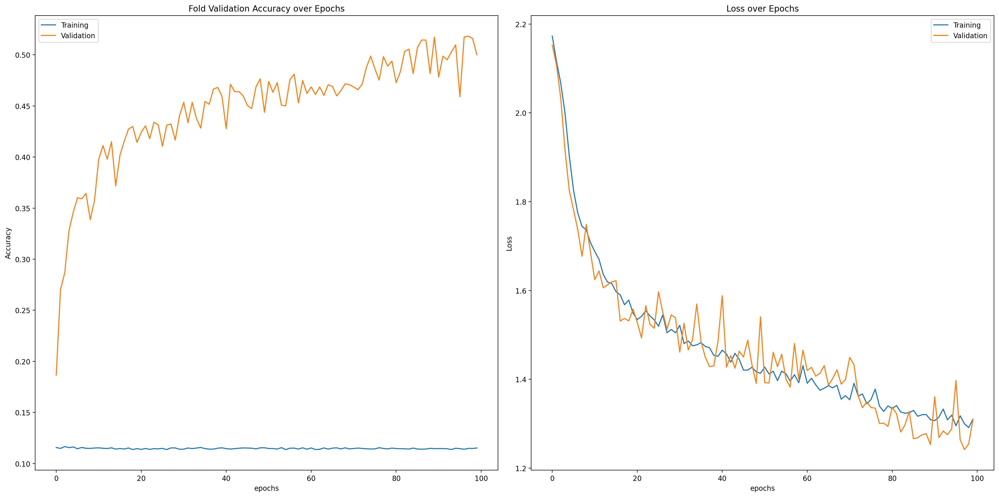

30/30 [==============================] - 0s 7ms/step
Fold validation accuracy: 0.49993208050727844
Graph 2:


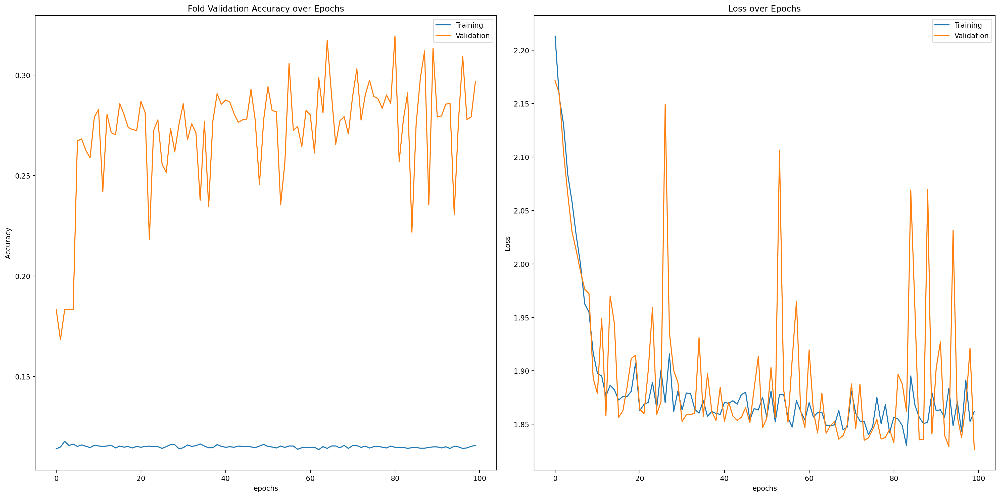

30/30 [==============================] - 0s 6ms/step
Fold validation accuracy: 0.296875
Graph 3:


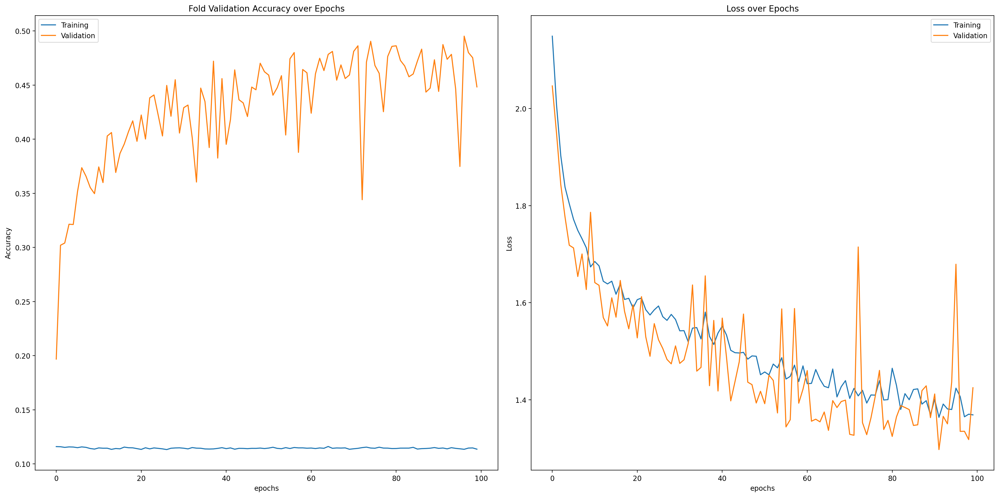

30/30 [==============================] - 0s 6ms/step
Fold validation accuracy: 0.44824808835983276
Graph 4:


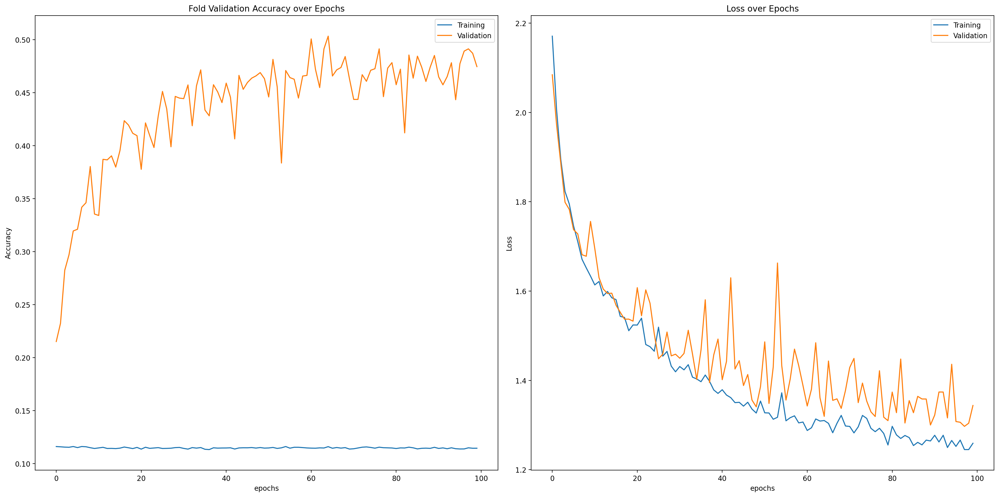

30/30 [==============================] - 0s 6ms/step
Fold validation accuracy: 0.47457388043403625
Graph 5:


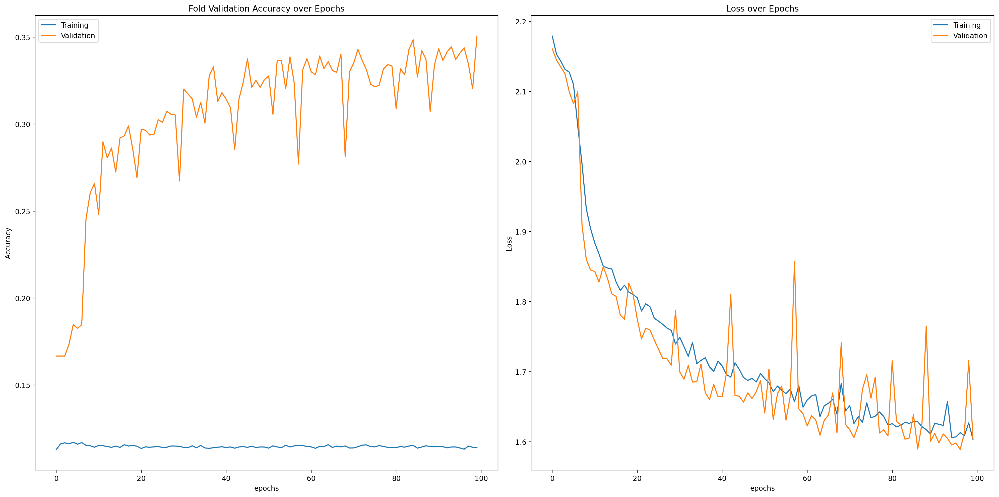

30/30 [==============================] - 0s 5ms/step
Fold validation accuracy: 0.350615531206131
CPU times: user 1h 51min 6s, sys: 10min 34s, total: 2h 1min 40s
Wall time: 39min 49s


In [181]:
%%time
cnn1 = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=16, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(11, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred1, acc1 = test_model(data_set, labels, kf, cnn1, NUM_CLASSES, "cnn1_predictions.csv")

Graph 1:


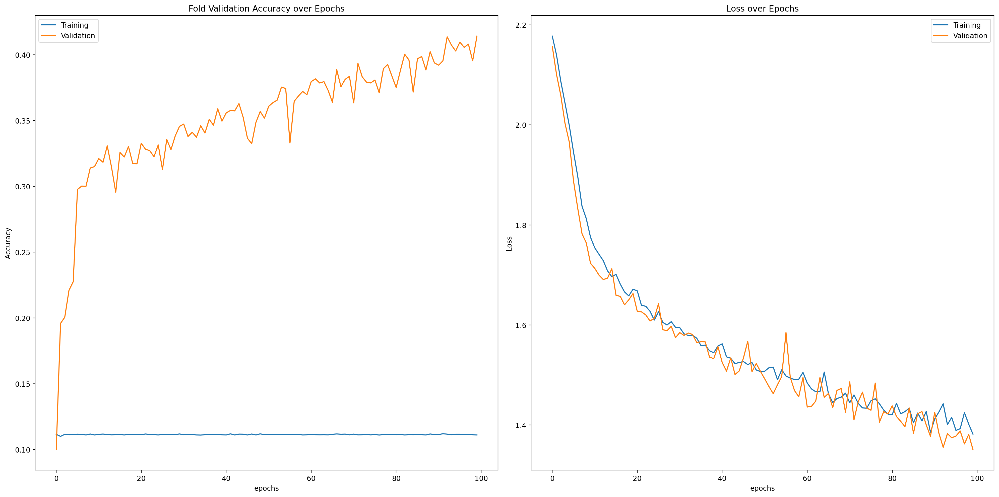

30/30 [==============================] - 0s 16ms/step
Fold validation accuracy: 0.41409093141555786
Graph 2:


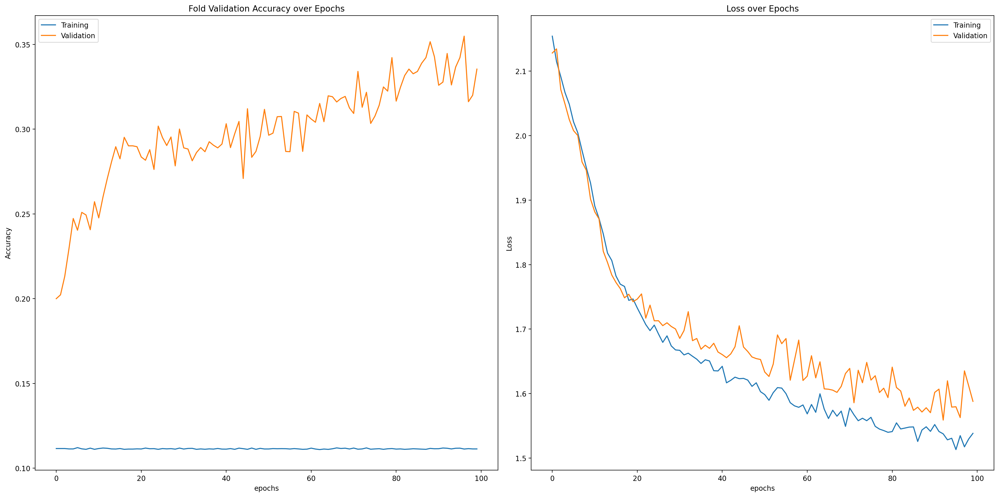

30/30 [==============================] - 0s 10ms/step
Fold validation accuracy: 0.3354450762271881
Graph 3:


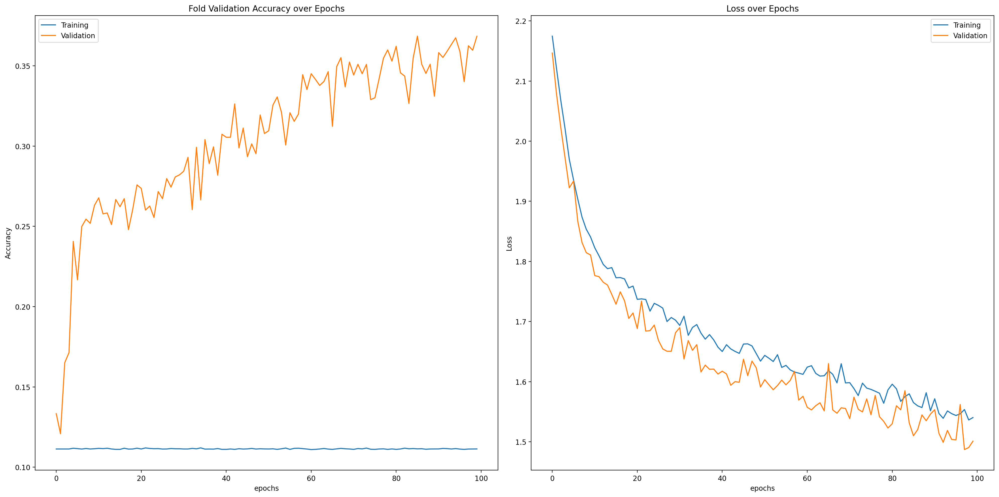

30/30 [==============================] - 0s 8ms/step
Fold validation accuracy: 0.3684413731098175
Graph 4:


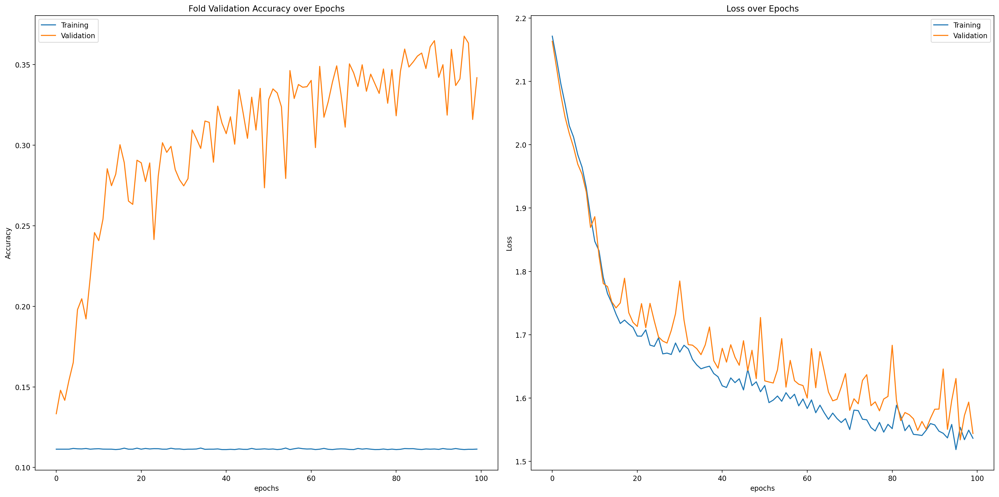

30/30 [==============================] - 0s 9ms/step
Fold validation accuracy: 0.34187886118888855
Graph 5:


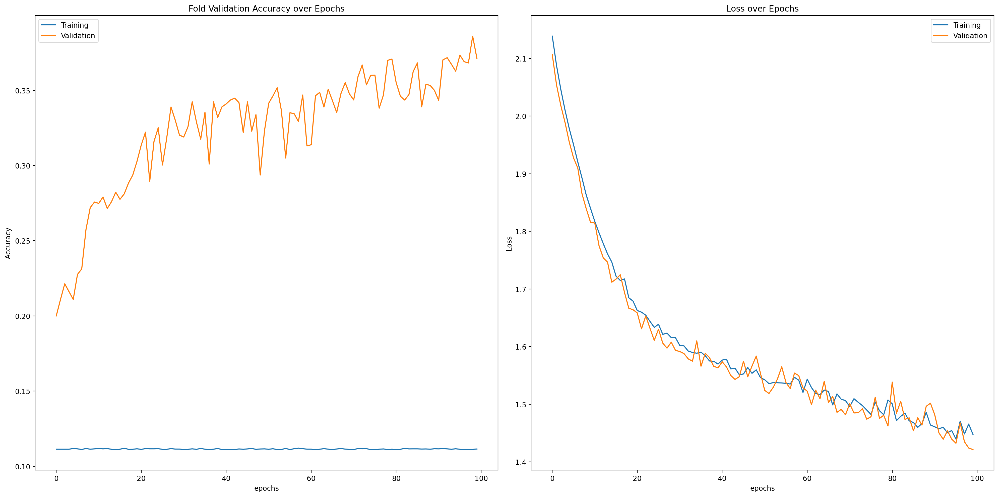

30/30 [==============================] - 0s 8ms/step
Fold validation accuracy: 0.3711998760700226
CPU times: user 1h 28min 4s, sys: 13min 32s, total: 1h 41min 37s
Wall time: 27min 12s


In [189]:
%%time
cnn1_modified = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(4, 4)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(12, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred1_modified, acc1_modified = test_model(data_set, labels, kf, cnn1_modified, NUM_CLASSES, "cnn1_modified_predictions.csv", bs=64, lr=0.0003)

Graph 1:


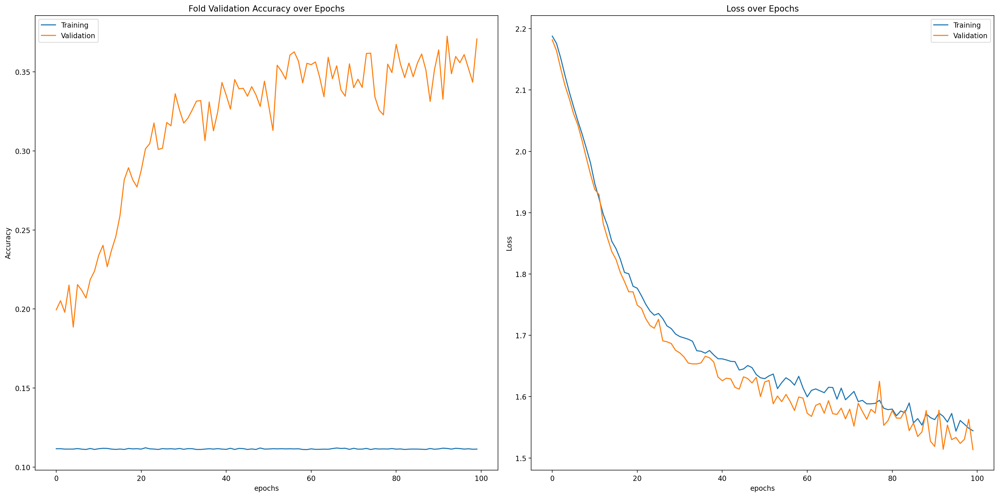

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.3708712160587311
Graph 2:


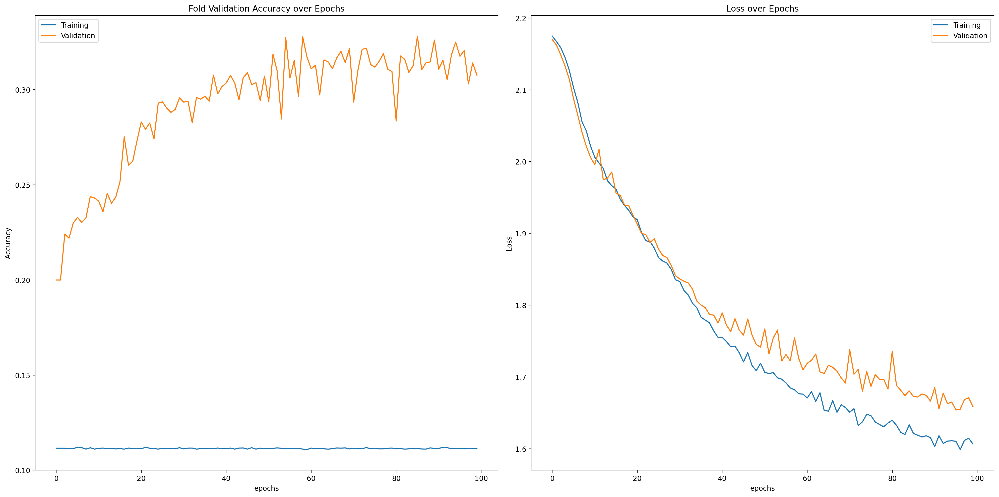

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.3077083230018616
Graph 3:


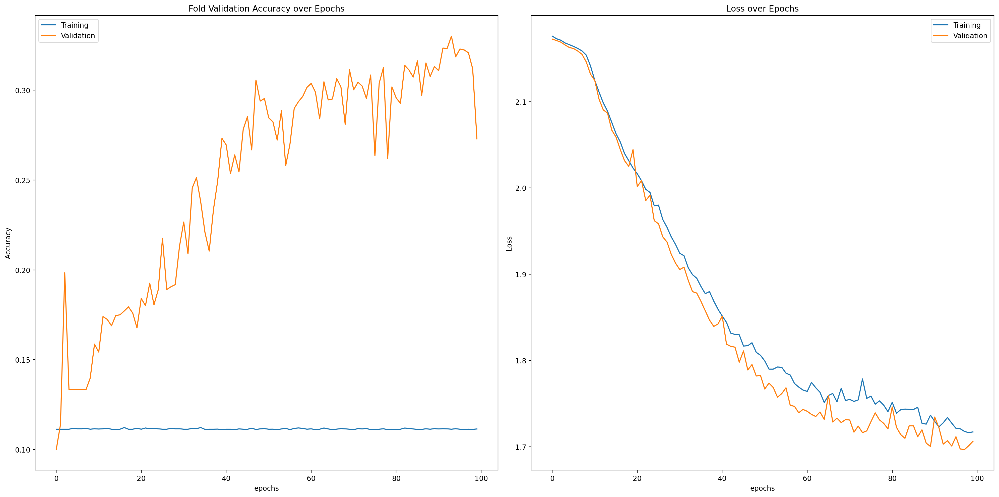

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.27291667461395264
Graph 4:


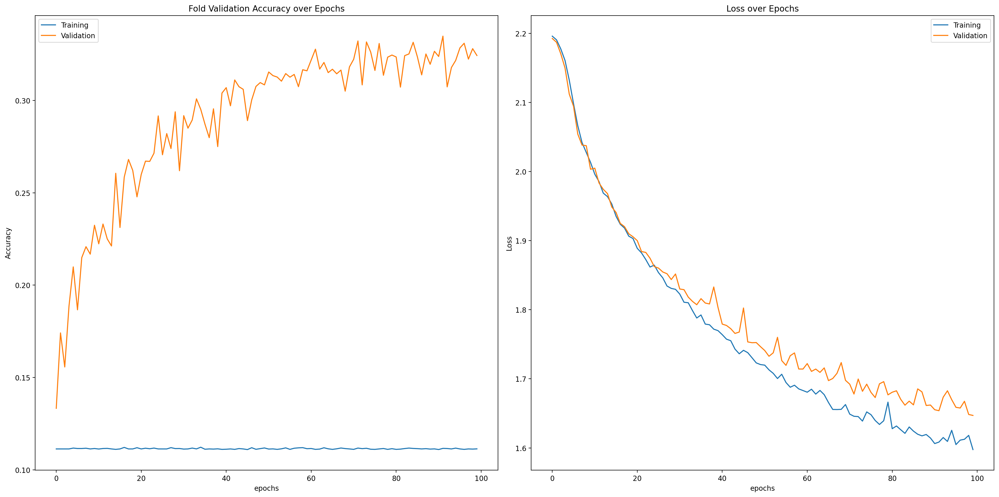

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.32430556416511536
Graph 5:


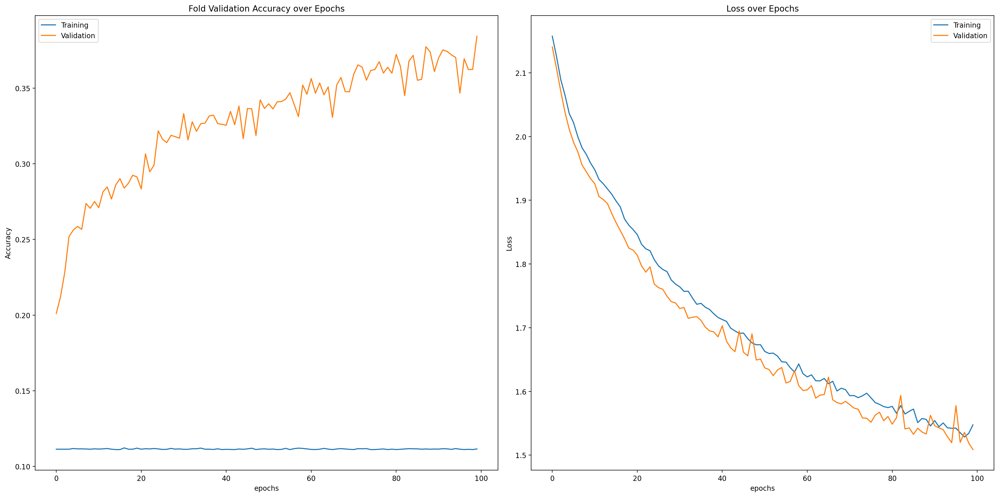

30/30 [==============================] - 0s 11ms/step
Fold validation accuracy: 0.3843942880630493
CPU times: user 2h 14min 2s, sys: 22min 4s, total: 2h 36min 7s
Wall time: 36min 3s


In [194]:
%%time
cnn2 = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(2, 2)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(11, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred2, acc2 = test_model(data_set, labels, kf, cnn2, NUM_CLASSES, "cnn2_predictions.csv", bs=64, lr=0.00008, ep=100)

Graph 1:


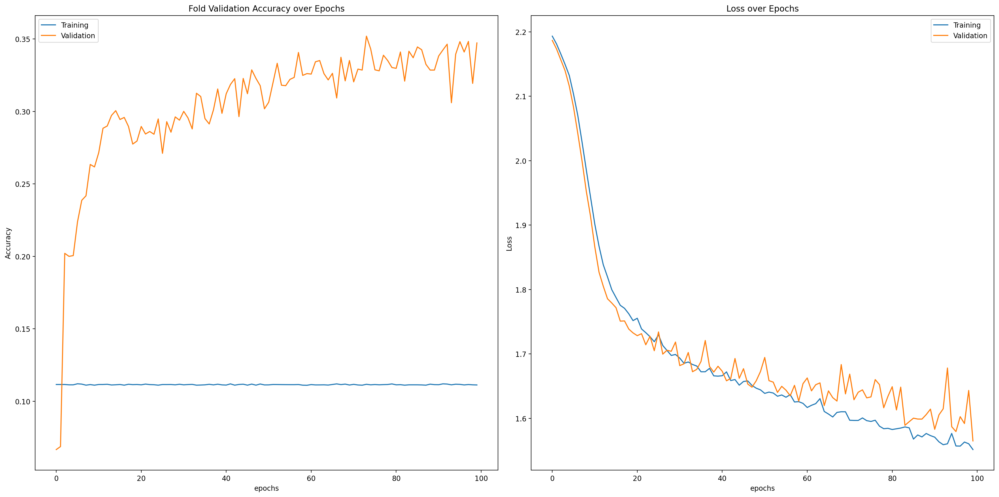

30/30 [==============================] - 0s 9ms/step
Fold validation accuracy: 0.34728220105171204
Graph 2:


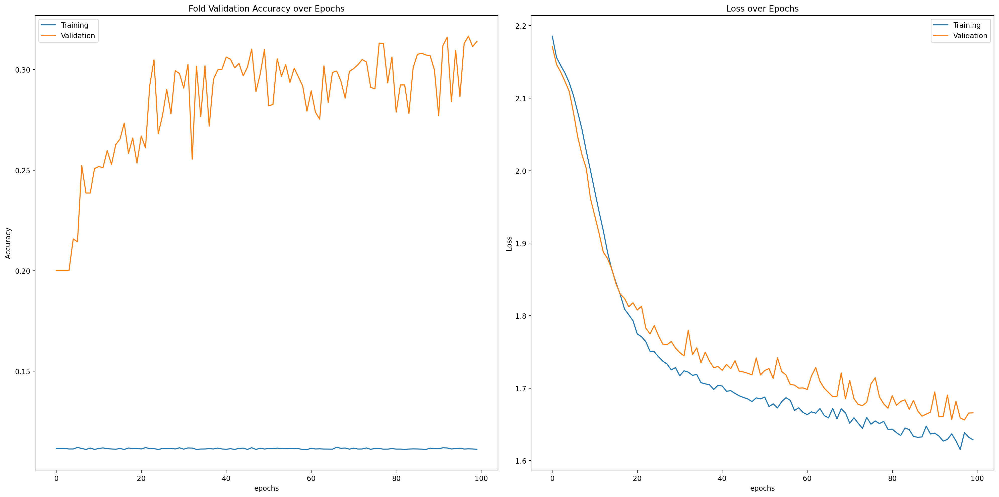

30/30 [==============================] - 0s 8ms/step
Fold validation accuracy: 0.31408146023750305
Graph 3:


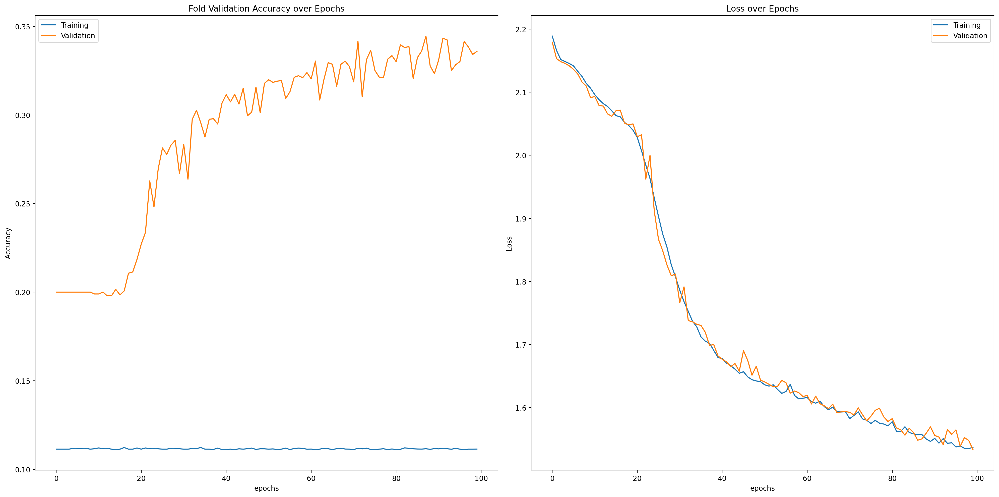

30/30 [==============================] - 0s 9ms/step
Fold validation accuracy: 0.33589890599250793
Graph 4:


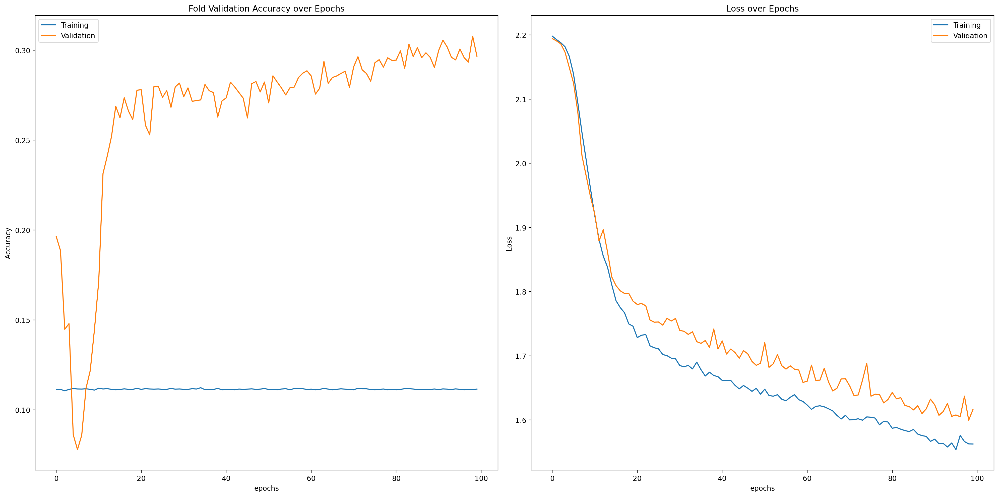

30/30 [==============================] - 0s 8ms/step
Fold validation accuracy: 0.29673996567726135
Graph 5:


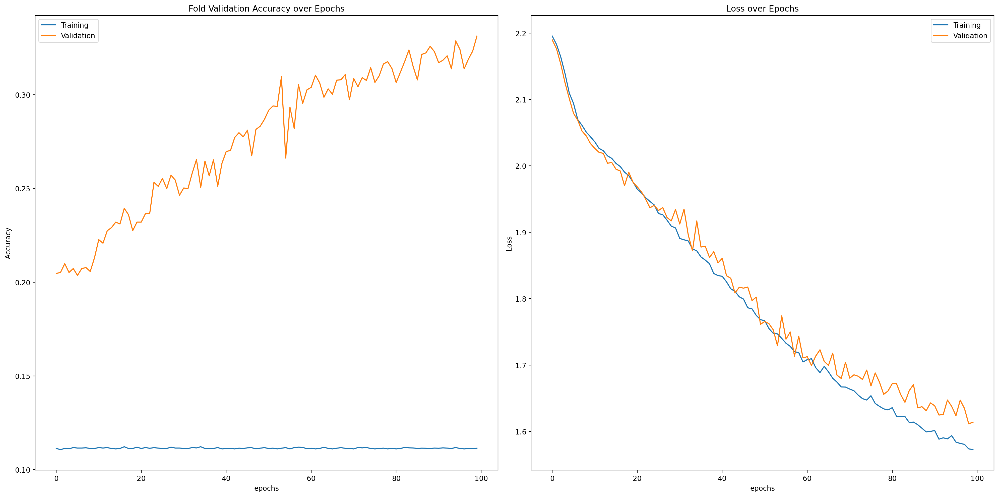

30/30 [==============================] - 0s 9ms/step
Fold validation accuracy: 0.33123070001602173
CPU times: user 1h 7min 41s, sys: 13min 24s, total: 1h 21min 6s
Wall time: 22min 59s


In [196]:
%%time
cnn2_modified = Sequential([
    tf.keras.layers.InputLayer(input_shape=(size, size, 1)),
    Conv2D(filters=32, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(4, 4)),
    Conv2D(filters=16, kernel_size= (2, 2), padding='same',input_shape=(size,size,1)),
    Activation('relu'),
    MaxPooling2D(pool_size=(4, 4)),
    data_augmentation,
    Flatten(),
    Dense(50, input_dim=1, activation='relu'),
    Dense(25, activation='relu'),
    Dense(12, activation='relu'),
    Dense(NUM_CLASSES, activation='softmax')
])
pred2_modified, acc2_modified = test_model(data_set, labels, kf, cnn2_modified, NUM_CLASSES, "cnn2_modified_predictions.csv", bs=64, lr=0.0002, ep=100)